In [60]:
import time
import pandas as pd
import json
import re
import nltk
import ast
import random
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from collections import Counter
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer
import gensim
from gensim import corpora
from gensim.models import LdaModel
from nrclex import NRCLex
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain  # Louvain community detection
from collections import defaultdict
from matplotlib.lines import Line2D
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [3]:
# Load the cleaned CSV
df = pd.read_csv("cleaned_vangogh_comments3.csv")

# Print the first 5 rows
print(df.head())

   source subreddit                                         post_title  \
0  reddit       Art  Why is Van Gogh so famous when his art looks a...   
1  reddit       Art  Why is Van Gogh so famous when his art looks a...   
2  reddit       Art  Why is Van Gogh so famous when his art looks a...   
3  reddit       Art  Why is Van Gogh so famous when his art looks a...   
4  reddit       Art  Why is Van Gogh so famous when his art looks a...   

                                           post_text  \
0  I posted this in AskReddit before, but it was ...   
1  I posted this in AskReddit before, but it was ...   
2  I posted this in AskReddit before, but it was ...   
3  I posted this in AskReddit before, but it was ...   
4  I posted this in AskReddit before, but it was ...   

                                            post_url       post_timestamp  \
0  https://www.reddit.com/r/Art/comments/674ffr/w...  2017-04-23T20:13:52   
1  https://www.reddit.com/r/Art/comments/674ffr/w...  2017-04-23

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


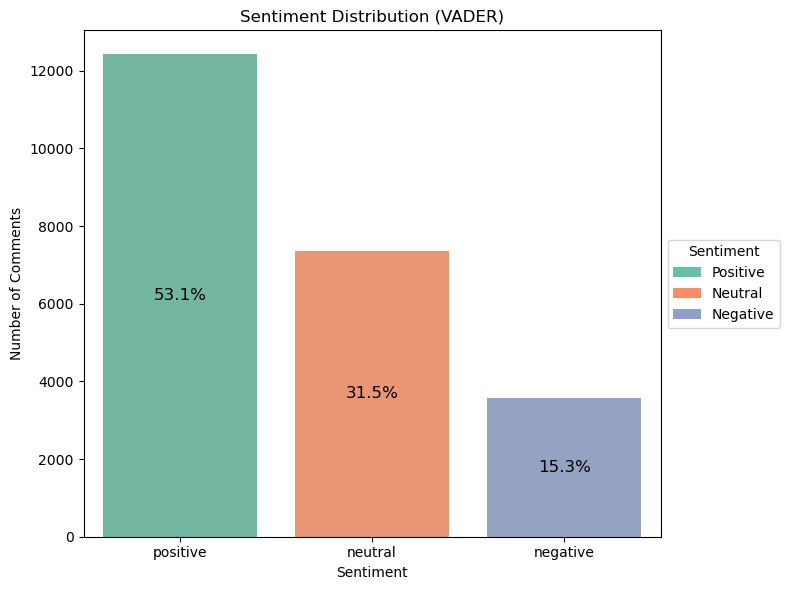

In [67]:
from matplotlib.patches import Patch

# Count the number of sentiments
sentiment_counts = df['sentiment'].value_counts(normalize=True) * 100  # percentages
sentiment_order = ['positive', 'neutral', 'negative']  # control order if needed

# Color palette mapping
palette = {'positive': '#66c2a5', 'neutral': '#fc8d62', 'negative': '#8da0cb'}  # Set2 colors

# Plot
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df, x='sentiment', order=sentiment_order, palette=palette)

# Add percentage labels on bars
for p in ax.patches:
    sentiment_label = p.get_x() + p.get_width() / 2
    height = p.get_height()
    percentage = (height / len(df)) * 100
    ax.annotate(f'{percentage:.1f}%', (sentiment_label, height / 2), ha='center', va='center', color='black', fontsize=12)

# Create custom legend
legend_labels = [Patch(facecolor=palette[s], label=s.capitalize()) for s in sentiment_order]
plt.legend(handles=legend_labels, title='Sentiment', loc='center left', bbox_to_anchor=(1, 0.5))

plt.title("Sentiment Distribution (VADER)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Comments")
plt.tight_layout()
plt.show()

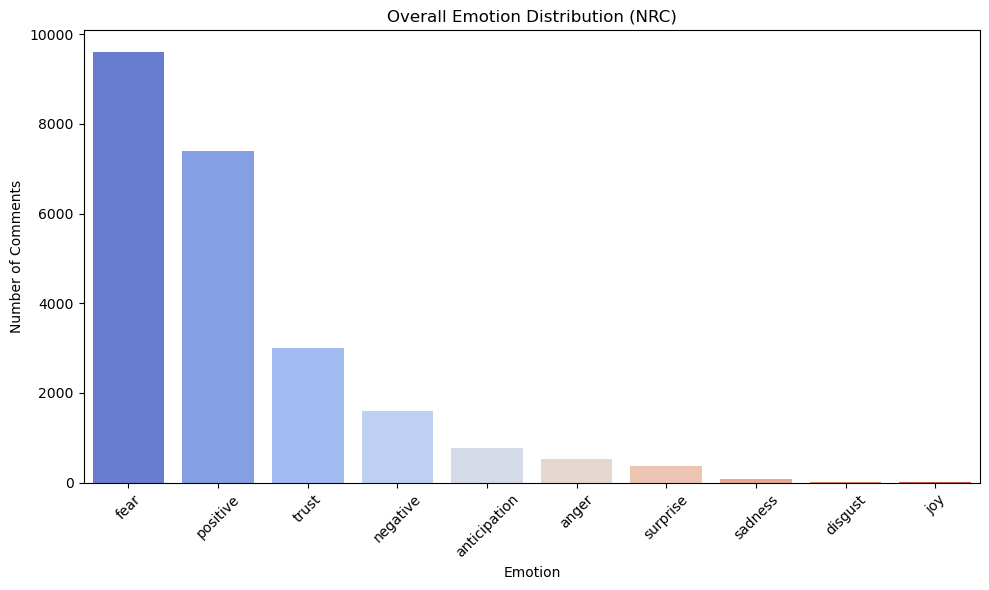

In [11]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x="nrc_emotion", order=df["nrc_emotion"].value_counts().index, palette="coolwarm")
plt.title("Overall Emotion Distribution (NRC)")
plt.xlabel("Emotion")
plt.ylabel("Number of Comments")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

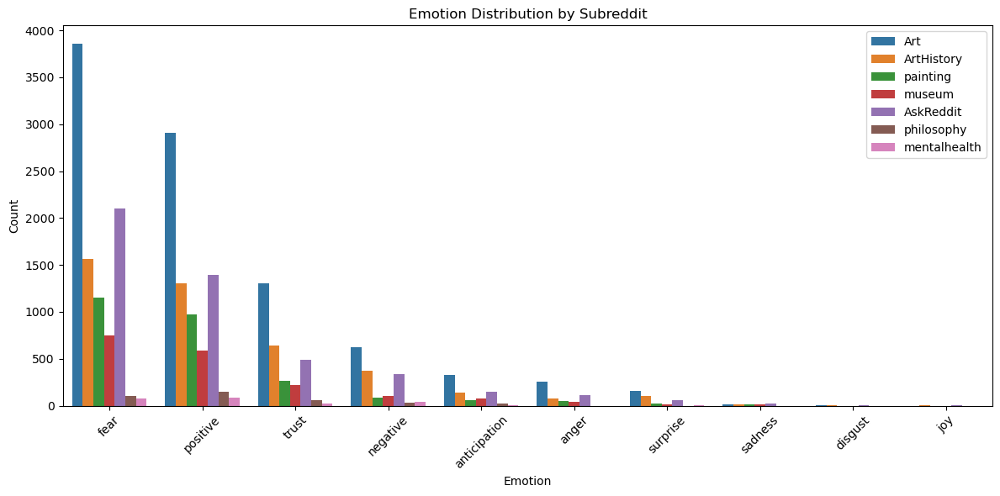

In [35]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x="nrc_emotion", hue="subreddit", order=df["nrc_emotion"].value_counts().index)
plt.title("Emotion Distribution by Subreddit")
plt.xlabel("Emotion")
plt.ylabel("Count")
plt.legend(loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
#NRC Emotion Lexicon Explanation:
# This file (NRC-Emotion-Lexicon-Wordlevel-v0.92.txt) maps words to eight basic emotions 
# (anger, anticipation, disgust, fear, joy, sadness, surprise, trust) and two sentiments (positive, negative).
# 
# In this code, we use it to build a dictionary (nrc) where each word is linked to the emotions it expresses.
# Only associations with a value of 1 are included, meaning the word has a confirmed link to that emotion.
# 
# This helps us perform fine-grained emotion analysis on text data (like Reddit comments) 
# to understand emotional tones such as sadness, joy, or fear over time.

In [12]:
nrc = {}

with open("NRC-Emotion-Lexicon-Wordlevel-v0.92.txt", "r", encoding="utf-8") as f:
    for line in f:
        word, emotion, association = line.strip().split('\t')
        if int(association) == 1:
            if word not in nrc:
                nrc[word] = []
            nrc[word].append(emotion)

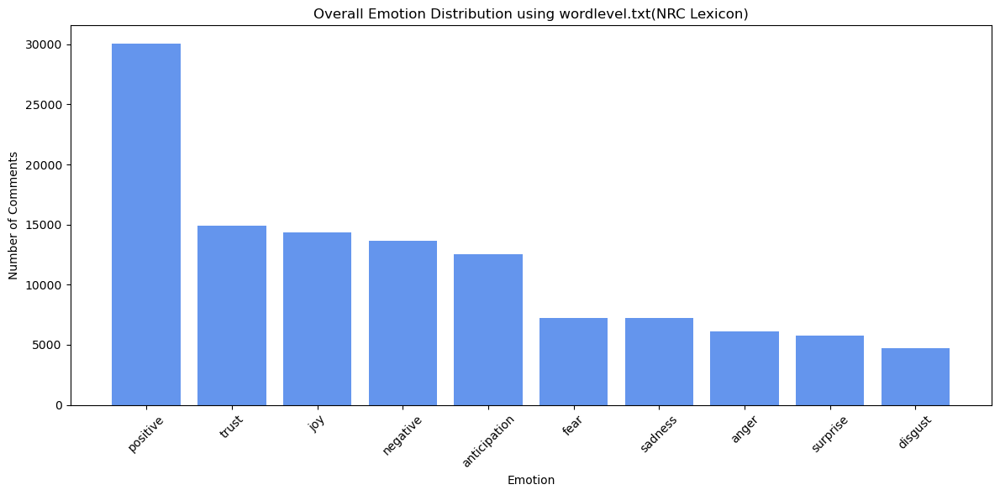

In [15]:
# Flatten the token lists
flat_tokens = []
for tokens in df['filtered_tokens'].dropna():
    if isinstance(tokens, list):
        flat_tokens.extend([word.lower() for word in tokens])
    elif isinstance(tokens, str) and tokens.startswith("[") and tokens.endswith("]"):
        # Handle stringified lists (optional check)
        try:
            eval_tokens = eval(tokens)
            if isinstance(eval_tokens, list):
                flat_tokens.extend([word.lower() for word in eval_tokens])
        except:
            continue

# Count matched emotions
emotion_count = defaultdict(int)
for token in flat_tokens:
    for emotion in nrc.get(token, []):
        emotion_count[emotion] += 1

# Plot results
if emotion_count:
    emotion_df = pd.DataFrame.from_dict(emotion_count, orient='index', columns=['Count']).reset_index()
    emotion_df.columns = ['Emotion', 'Count']
    emotion_df.sort_values(by='Count', ascending=False, inplace=True)

    plt.figure(figsize=(12, 6))
    plt.bar(emotion_df['Emotion'], emotion_df['Count'], color='cornflowerblue')
    plt.xticks(rotation=45)
    plt.title("Overall Emotion Distribution using wordlevel.txt(NRC Lexicon)")
    plt.xlabel("Emotion")
    plt.ylabel("Number of Comments")
    plt.tight_layout()
    plt.show()
else:
    print("No emotions found. Double-check token matching and file content.")


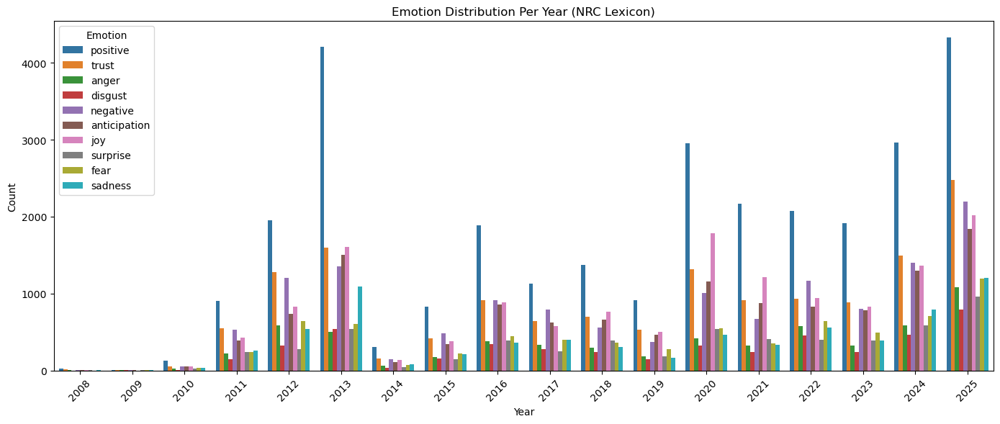

In [16]:
# Creating a year column from timestamp 
df['year'] = pd.to_datetime(df['timestamp']).dt.year

yearly_emotion_data = []

for year in sorted(df['year'].unique()):
    year_tokens = []
    for tokens in df[df['year'] == year]['filtered_tokens'].dropna():
        if isinstance(tokens, list):
            year_tokens.extend([t.lower() for t in tokens])
        elif isinstance(tokens, str):
            try:
                year_tokens.extend([t.lower() for t in eval(tokens)])
            except:
                continue

    emotion_count = defaultdict(int)
    for token in year_tokens:
        for emotion in nrc.get(token, []):
            emotion_count[emotion] += 1

    yearly_emotion_data.append(pd.DataFrame({
        'Emotion': list(emotion_count.keys()),
        'Count': list(emotion_count.values()),
        'Year': year
    }))

# Combine into a single DataFrame
emotion_by_year_df = pd.concat(yearly_emotion_data)

# Plot 
plt.figure(figsize=(14, 6))
sns.barplot(data=emotion_by_year_df, x="Year", y="Count", hue="Emotion")
plt.title("Emotion Distribution Per Year (NRC Lexicon)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


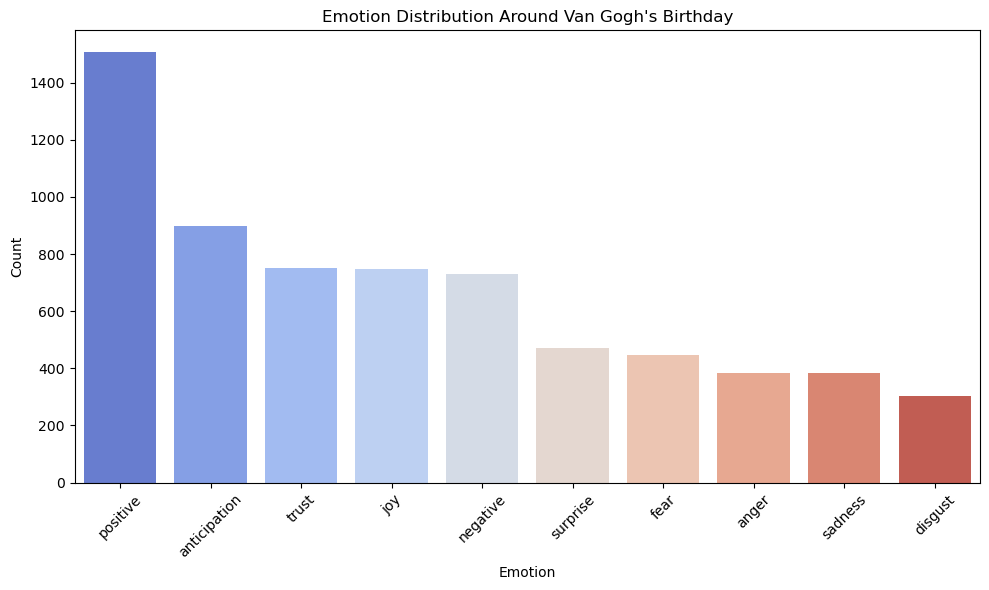

In [17]:
from datetime import datetime, timedelta

# Define the event range
event_dates = []
for year in df['year'].unique():
    event_date = datetime(year, 3, 30)
    for offset in range(-3, 4):
        event_dates.append((event_date + timedelta(days=offset)).date())

df['date_only'] = pd.to_datetime(df['timestamp']).dt.date
event_df = df[df['date_only'].isin(event_dates)]

# Flatten tokens
event_tokens = []
for tokens in event_df['filtered_tokens'].dropna():
    if isinstance(tokens, list):
        event_tokens.extend([t.lower() for t in tokens])
    elif isinstance(tokens, str):
        try:
            event_tokens.extend([t.lower() for t in eval(tokens)])
        except:
            continue

# Count emotions
emotion_count = defaultdict(int)
for token in event_tokens:
    for emotion in nrc.get(token, []):
        emotion_count[emotion] += 1

# Plot
emotion_df = pd.DataFrame.from_dict(emotion_count, orient='index', columns=['Count']).reset_index()
emotion_df.columns = ['Emotion', 'Count']
emotion_df.sort_values(by='Count', ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(data=emotion_df, x='Emotion', y='Count', palette='coolwarm')
plt.title("Emotion Distribution Around Van Gogh's Birthday")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [18]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

df['compound'] = df['final_cleaned'].astype(str).apply(lambda x: analyzer.polarity_scores(x)['compound'])

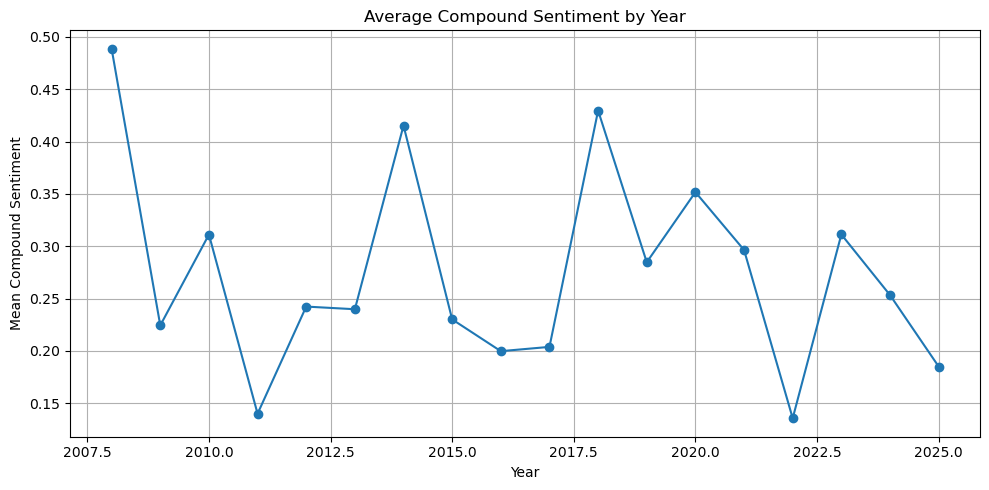

In [19]:
# Check if 'compound' exists
if 'compound' in df.columns:
    plt.figure(figsize=(10, 5))
    yearly_sentiment = df.groupby('year')['compound'].mean()
    yearly_sentiment.plot(marker='o')
    plt.title("Average Compound Sentiment by Year")
    plt.ylabel("Mean Compound Sentiment")
    plt.xlabel("Year")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

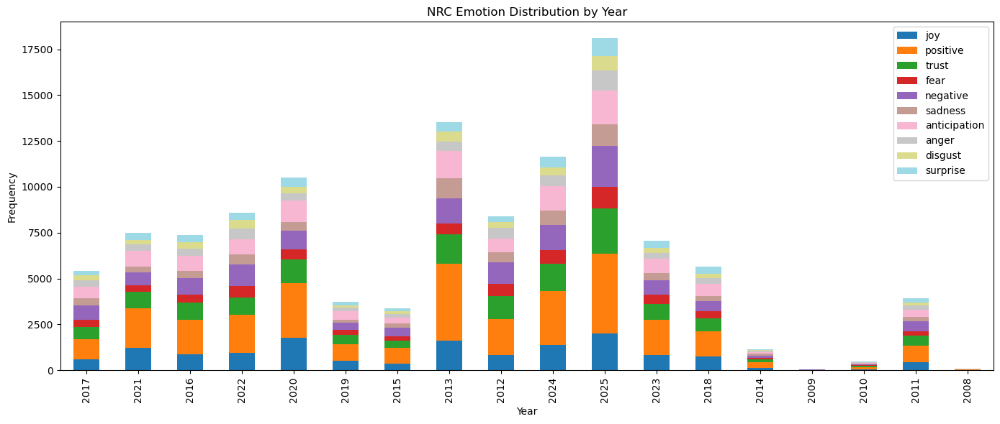

In [20]:
# Load NRC Lexicon
nrc = {}
with open("NRC-Emotion-Lexicon-Wordlevel-v0.92.txt", "r", encoding="utf-8") as f:
    for line in f:
        word, emotion, association = line.strip().split('\t')
        if int(association) == 1:
            nrc.setdefault(word, []).append(emotion)

# Compute emotion counts by year
from collections import defaultdict

yearly_emotions = defaultdict(lambda: defaultdict(int))

for _, row in df.iterrows():
    tokens = eval(row['filtered_tokens']) if isinstance(row['filtered_tokens'], str) else []
    year = row['year']
    for token in tokens:
        for emo in nrc.get(token.lower(), []):
            yearly_emotions[year][emo] += 1

# Convert to DataFrame
emotion_df = pd.DataFrame(yearly_emotions).fillna(0).astype(int).T
emotion_df.plot(kind='bar', stacked=True, figsize=(14, 6), colormap="tab20")
plt.title("NRC Emotion Distribution by Year")
plt.ylabel("Frequency")
plt.xlabel("Year")
plt.tight_layout()
plt.show()

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if

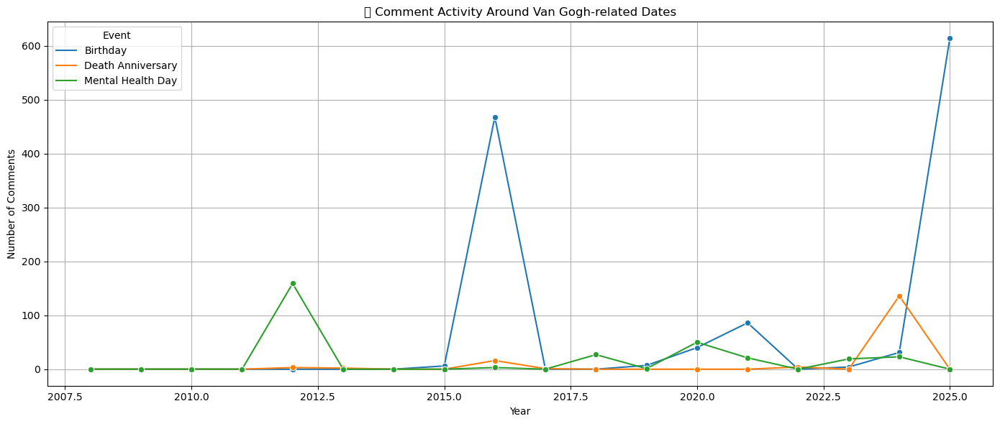

In [65]:
from datetime import timedelta
import seaborn as sns

# Ensure timestamp is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
df = df.dropna(subset=['timestamp'])

# Extract year from timestamp
df['year'] = df['timestamp'].dt.year

# Define important dates
key_dates = {
    "Birthday": (3, 30),
    "Death Anniversary": (7, 29),
    "Mental Health Day": (10, 10)
}

# Count comments around these dates per year
records = []
for year in range(df['year'].min(), df['year'].max() + 1):
    for event, (month, day) in key_dates.items():
        event_date = pd.Timestamp(year=year, month=month, day=day)
        window_start = event_date - timedelta(days=3)
        window_end = event_date + timedelta(days=3)
        count = df[(df['timestamp'] >= window_start) & (df['timestamp'] <= window_end)].shape[0]
        records.append({"Year": year, "Event": event, "Date": event_date, "Comment_Count": count})

events_df = pd.DataFrame(records)

# Plotting
plt.figure(figsize=(14, 6))
sns.lineplot(data=events_df, x="Year", y="Comment_Count", hue="Event", marker="o")
plt.title("📈 Comment Activity Around Van Gogh-related Dates")
plt.xlabel("Year")
plt.ylabel("Number of Comments")
plt.grid(True)
plt.tight_layout()
plt.show()


📅 Birthday – Emotion Breakdown ±3 Days


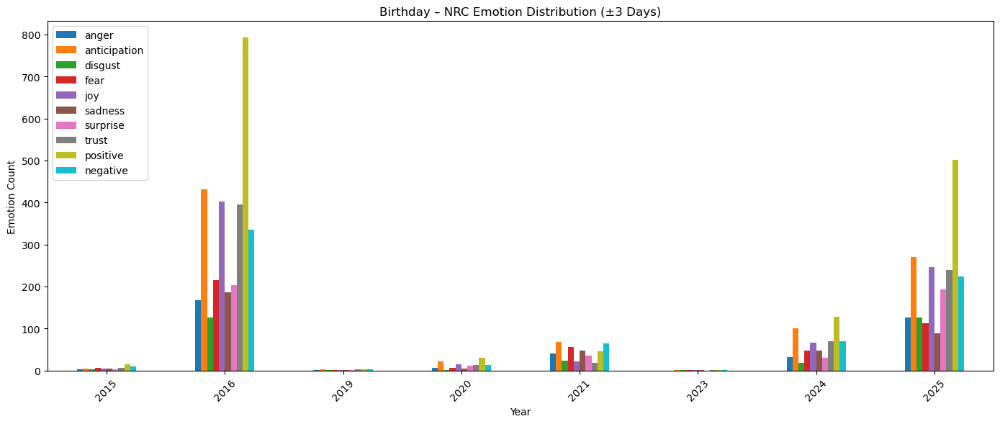


📅 Death Anniversary – Emotion Breakdown ±3 Days


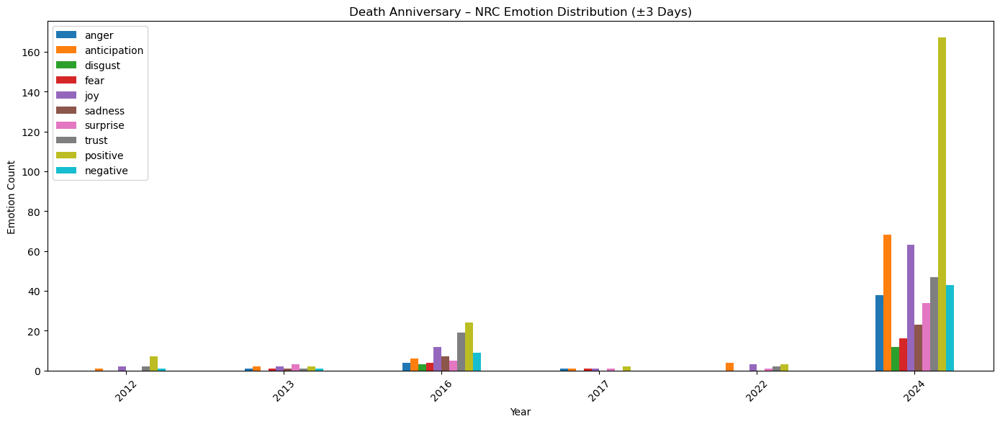


📅 Mental Health Day – Emotion Breakdown ±3 Days


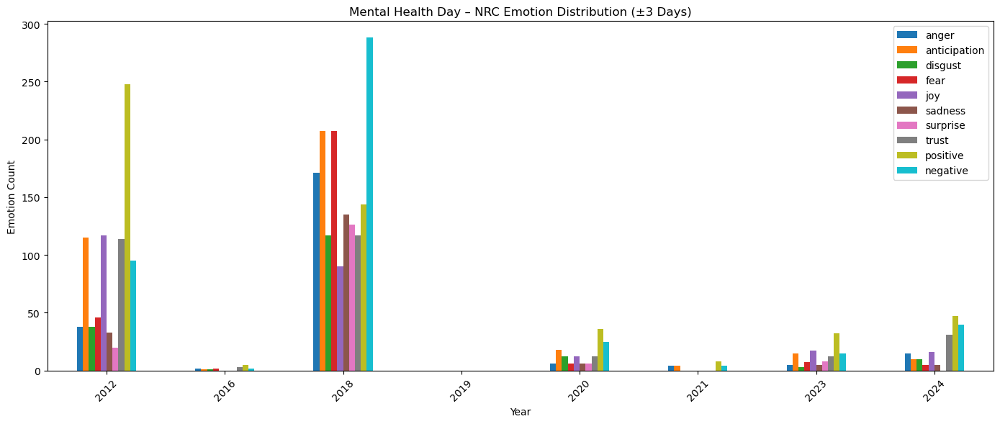

In [68]:
from datetime import timedelta
from collections import defaultdict
import matplotlib.pyplot as plt

# Ensure timestamp is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
df = df.dropna(subset=['timestamp'])

# Extract year from timestamp (if not already done)
df['year'] = df['timestamp'].dt.year

# Define key symbolic dates
event_dates = {
    "Birthday": (3, 30),
    "Death Anniversary": (7, 29),
    "Mental Health Day": (10, 10)
}

# Emotion columns you extracted from NRC
emotion_cols = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust', 'positive', 'negative']

# Loop through each symbolic event
for event_name, (month, day) in event_dates.items():
    print(f"\n📅 {event_name} – Emotion Breakdown ±3 Days")

    all_years = sorted(df['year'].unique())
    yearly_emotions = {}

    for year in all_years:
        try:
            event_date = pd.Timestamp(year=year, month=month, day=day)
        except:
            continue
        start = event_date - timedelta(days=3)
        end = event_date + timedelta(days=3)

        window_df = df[(df['timestamp'] >= start) & (df['timestamp'] <= end)]

        if not window_df.empty:
            emotion_sums = window_df[emotion_cols].sum()
            yearly_emotions[year] = emotion_sums

    # Convert to DataFrame and Plot
    emo_df = pd.DataFrame(yearly_emotions).T
    emo_df.plot(kind='bar', figsize=(14, 6), title=f"{event_name} – NRC Emotion Distribution (±3 Days)")
    plt.xlabel("Year")
    plt.ylabel("Emotion Count")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


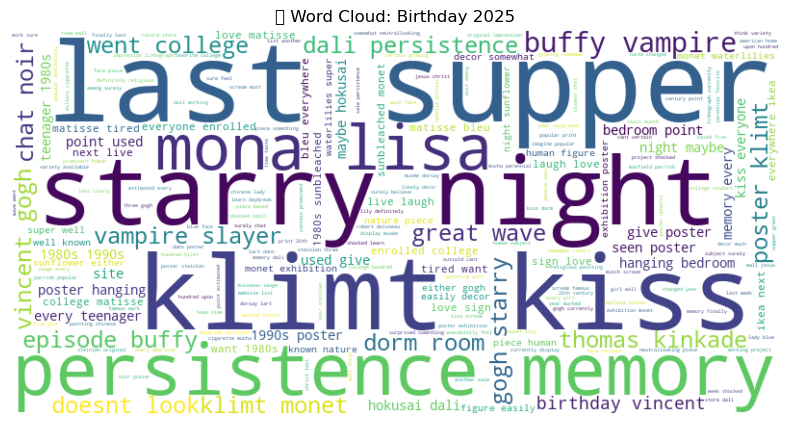

C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


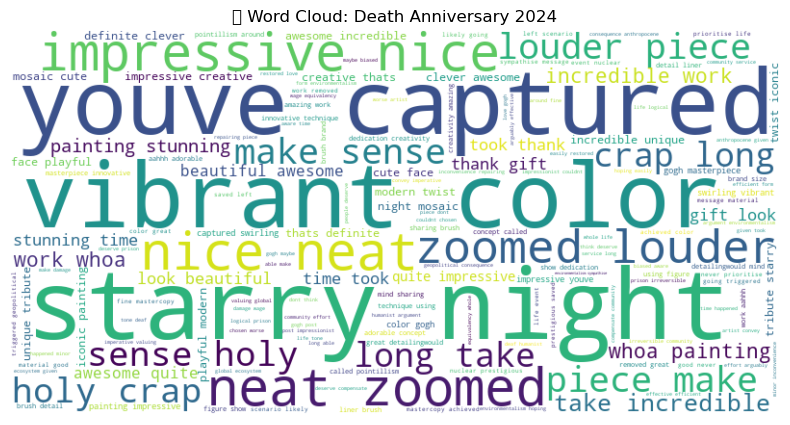

C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


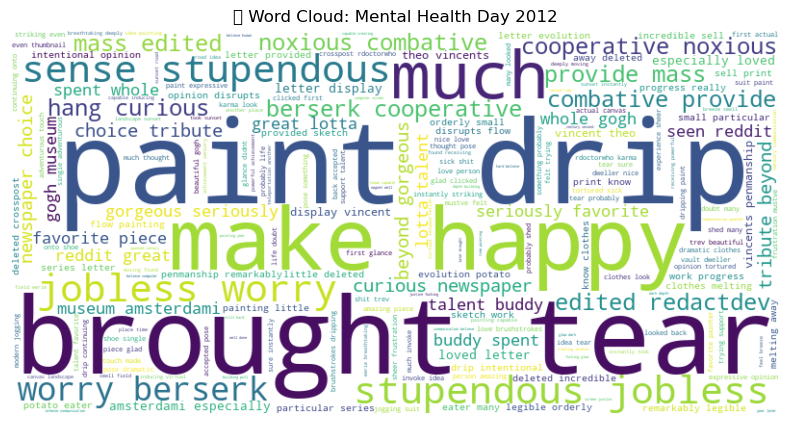


🎯 Comment Summary Around Van Gogh Events:

                    Event  Total Comments  Sentiment Mean  Sentiment Std  \
0           Birthday 2025             581        0.112683       0.235921   
1  Death Anniversary 2024             136        0.462723       0.393073   
2  Mental Health Day 2012             154        0.261687       0.333634   

     Peak Day                                    Example Comment  
0  2025-03-31                       process maintain color rainy  
1  2024-07-29  sympathise message material good never priorit...  
2  2012-10-11  sense stupendous jobless worry berserk coopera...  


In [42]:
from textblob import TextBlob
from datetime import timedelta
# Convert timestamp and clean
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
df = df.dropna(subset=['timestamp'])
df['year'] = df['timestamp'].dt.year

# Define key dates
event_windows = {
    "Birthday 2025": pd.Timestamp("2025-03-30"),
    "Death Anniversary 2024": pd.Timestamp("2024-07-29"),
    "Mental Health Day 2012": pd.Timestamp("2012-10-10")
}

# Analyze each event
summaries = []

def extract_window_comments(df, event_date, window_days=3):
    start = event_date - timedelta(days=window_days)
    end = event_date + timedelta(days=3)
    return df[(df['timestamp'] >= start) & (df['timestamp'] <= end)].copy()

for label, date in event_windows.items():
    subset = extract_window_comments(df, date)
    subset = subset.dropna(subset=["final_cleaned"])
    texts = subset['final_cleaned'].astype(str)

    # Sentiment analysis
    sentiments = texts.apply(lambda x: TextBlob(x).sentiment.polarity)
    sentiment_summary = sentiments.describe()

    # Word Cloud
    all_text = " ".join(texts)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud: {label}")
    plt.show()

    # Save summary
    summaries.append({
        "Event": label,
        "Total Comments": len(texts),
        "Sentiment Mean": sentiment_summary['mean'],
        "Sentiment Std": sentiment_summary['std'],
        "Peak Day": subset['timestamp'].dt.date.value_counts().idxmax() if not subset.empty else "N/A",
        "Example Comment": texts.iloc[0] if not texts.empty else "N/A"
    })

# Final DataFrame summary
summary_df = pd.DataFrame(summaries)
print("\nComment Summary Around Van Gogh Events:\n")
print(summary_df)

C:\Users\HP\AppData\Local\Temp\ipykernel_49060\3451360165.py:46: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  plt.tight_layout()
C:\Users\HP\AppData\Local\Temp\ipykernel_49060\3451360165.py:46: UserWarning: Glyph 128198 (\N{TEAR-OFF CALENDAR}) missing from current font.
  plt.tight_layout()
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128198 (\N{TEAR-OFF CALENDAR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


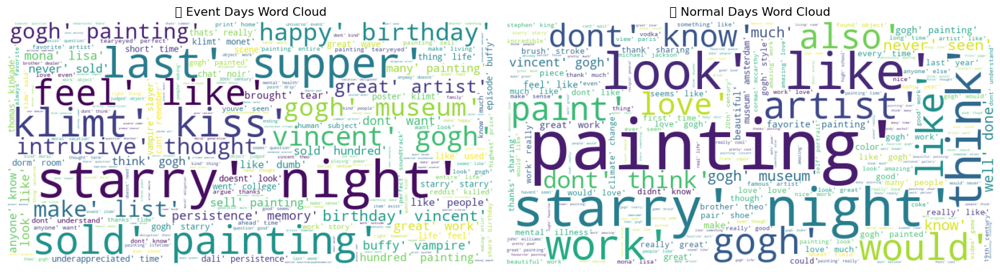

In [43]:
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
df = df.dropna(subset=['timestamp'])
df['final_cleaned'] = df['final_cleaned'].astype(str)

# Step 1: Recreate 'event_day' column
event_days = []
for year in df['timestamp'].dt.year.unique():
    for base in ['03-30', '07-29', '10-10']:  # Birthday, Death, Mental Health Day
        try:
            base_date = pd.to_datetime(f"{year}-{base}")
            for offset in range(-3, 4):
                event_days.append(base_date + pd.Timedelta(days=offset))
        except:
            continue
df['event_day'] = df['timestamp'].dt.date.isin([d.date() for d in event_days])

# Step 2: Top 3 most positive & negative comments on event days
top_positive = df[df['event_day']].sort_values(by='compound', ascending=False).head(3)[['timestamp', 'final_cleaned', 'compound']]
top_negative = df[df['event_day']].sort_values(by='compound', ascending=True).head(3)[['timestamp', 'final_cleaned', 'compound']]

# Step 3: Word frequency comparison
def get_top_words(text_series, top_n=20):
    all_words = " ".join(text_series).split()
    return Counter(all_words).most_common(top_n)

event_words = get_top_words(df[df['event_day']]['filtered_tokens'].dropna().astype(str))
normal_words = get_top_words(df[~df['event_day']]['filtered_tokens'].dropna().astype(str))

# Step 4: Word clouds
event_text = " ".join(df[df['event_day']]['filtered_tokens'].dropna().astype(str))
normal_text = " ".join(df[~df['event_day']]['filtered_tokens'].dropna().astype(str))

event_wc = WordCloud(width=800, height=400, background_color='white').generate(event_text)
normal_wc = WordCloud(width=800, height=400, background_color='white').generate(normal_text)

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.imshow(event_wc, interpolation='bilinear')
plt.axis('off')
plt.title("Event Days Word Cloud")

plt.subplot(1, 2, 2)
plt.imshow(normal_wc, interpolation='bilinear')
plt.axis('off')
plt.title("Normal Days Word Cloud")
plt.tight_layout()
plt.show()

In [73]:
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
df = df.dropna(subset=['timestamp'])
df['final_cleaned'] = df['final_cleaned'].astype(str)
df['year'] = df['timestamp'].dt.year
df['date_only'] = df['timestamp'].dt.date

# Apply sentiment if 'compound' column doesn't exist
if 'compound' not in df.columns:
    analyzer = SentimentIntensityAnalyzer()
    df['compound'] = df['final_cleaned'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

# Step 1: Find the highest comment day per year
daily_counts = df.groupby(['year', 'date_only']).size().reset_index(name='comment_count')
peak_days_per_year = daily_counts.loc[daily_counts.groupby('year')['comment_count'].idxmax()]

# Step 2: Get top 5 comments by upvotes on each year's peak day
top_comments_all_years = []
for _, row in peak_days_per_year.iterrows():
    year = row['year']
    peak_date = row['date_only']
    top_comments = df[df['date_only'] == peak_date][['timestamp', 'final_cleaned', 'compound', 'score']].sort_values(by='score', ascending=False).head(5)
    top_comments.insert(0, 'Year', year)
    top_comments.insert(1, 'Peak Date', peak_date)
    top_comments_all_years.append(top_comments)

top_df = pd.concat(top_comments_all_years, ignore_index=True)

# Display the result locally
print(" Top 5 Comments on Peak Comment Day per Year:")
display(top_df)

# Optional: Save to CSV if needed
top_df.to_csv("top_comments_on_peak_days.csv", index=False)


 Top 5 Comments on Peak Comment Day per Year:


,Year,Peak Date,timestamp,final_cleaned,compound,score
0,2008,2008-11-29,2008-11-29 18:56:30,right next college local target course else re...,0.8755,15
1,2008,2008-11-29,2008-11-29 21:10:10,print guess good going agree sentiment support...,0.9721,7
2,2008,2008-11-29,2008-11-29 19:04:28,local college poster sale beginning semester g...,0.4404,5
3,2008,2008-11-29,2008-11-29 20:06:53,classic offer quite modern work quality great,0.6249,4
4,2008,2008-11-29,2008-11-29 18:48:39,dont million dollar hanging around believe tec...,0.9300,4
...,...,...,...,...,...,...
85,2025,2025-04-12,2025-04-12 13:53:18,sobbed first time episode wish could known wor...,-0.0516,332
86,2025,2025-04-12,2025-04-12 13:53:18,sobbed first time episode wish could known wor...,-0.0516,331
87,2025,2025-04-12,2025-04-12 13:53:18,sobbed first time episode wish could known wor...,-0.0516,330
88,2025,2025-04-12,2025-04-12 13:53:18,sobbed first time episode wish could known wor...,-0.0516,330


In [47]:
summary_data = []

for _, row in peak_days_per_year.iterrows():
    year = row['year']
    peak_date = row['date_only']
    comments = df[df['date_only'] == peak_date]

    # Top keywords (token-level)
    top_words = Counter(" ".join(comments['filtered_tokens'].astype(str)).split()).most_common(10)
    mean_sentiment = round(comments['compound'].mean(), 3)
    median_sentiment = round(comments['compound'].median(), 3)
    total_comments = len(comments)

    summary_data.append({
        "Year": year,
        "Peak Date": peak_date,
        "Total Comments": total_comments,
        "Mean Sentiment": mean_sentiment,
        "Median Sentiment": median_sentiment,
        "Top Words": ", ".join([word for word, _ in top_words])
    })

summary_df = pd.DataFrame(summary_data)
display(summary_df) 

,Year,Peak Date,Total Comments,Mean Sentiment,Median Sentiment,Top Words
0,2008,2008-11-29,9,0.548,0.625,"'artist',, 'local',, 'like',, 'print',, 'repro..."
1,2009,2009-05-11,5,0.396,0.440,"['gogh',, 'museum',, 'awesome',, 'amsterdam',,..."
2,2010,2010-11-10,21,0.507,0.637,"'creative',, 'think',, 'artist',, 'good',, 'cr..."
3,2011,2011-08-06,463,0.130,0.000,"'juice',, 'drink',, 'like',, 'vodka',, 'coke',..."
4,2012,2012-11-29,380,0.306,0.361,"'painting',, 'paint',, 'gogh',, 'like',, 'real..."
5,2013,2013-08-22,1407,0.273,0.000,"'music',, 'like',, 'think',, 'remembered',, 't..."
6,2014,2014-01-29,30,0.264,0.330,"'creativity',, 'creative',, 'think',, 'outside..."
7,2015,2015-04-05,408,0.241,0.178,"'gogh',, 'painting',, 'amsterdam',, 'like',, '..."
8,2016,2016-10-21,686,0.178,0.000,"'shoe',, 'like',, 'painting',, 'look',, 'gogh'..."
9,2017,2017-04-22,497,0.194,0.000,"'shoe',, 'painting',, 'gogh',, 'like',, 'reall..."


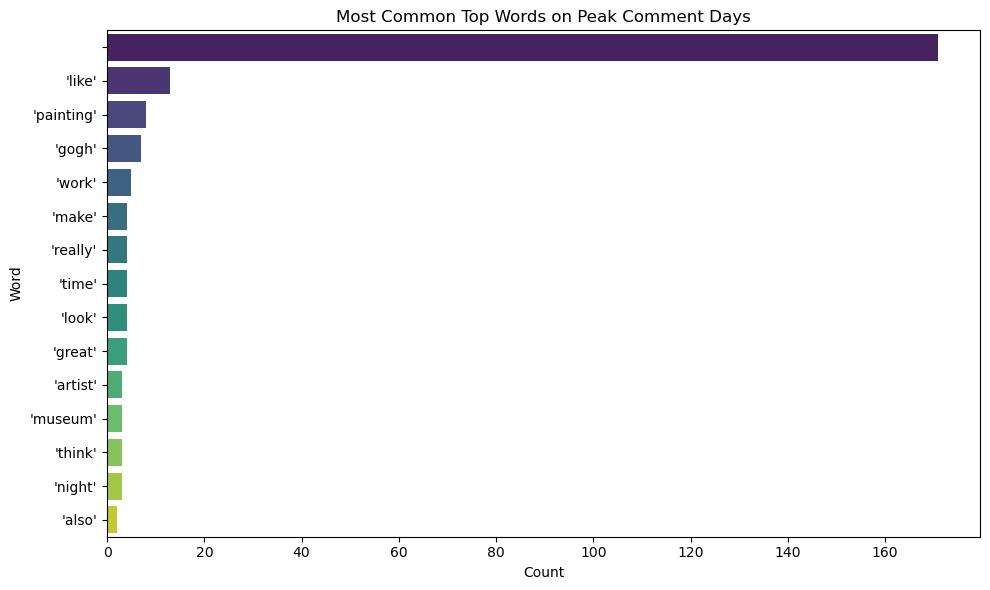

In [48]:
# Combine all top words across peak days
all_top_words = []

for words in summary_df['Top Words']:
    all_top_words.extend([word.strip() for word in words.split(',')])

word_freq = Counter(all_top_words)
top_15 = word_freq.most_common(15)

# Convert to DataFrame for plotting
top_words_df = pd.DataFrame(top_15, columns=["Word", "Frequency"])

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Frequency", y="Word", data=top_words_df, palette="viridis")
plt.title("Most Common Top Words on Peak Comment Days")
plt.xlabel("Count")
plt.ylabel("Word")
plt.tight_layout()
plt.show()

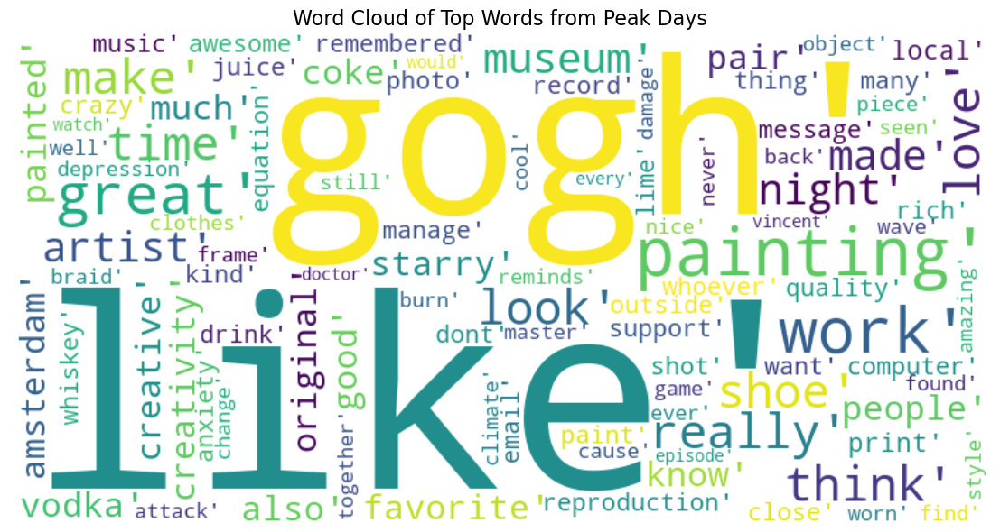

In [50]:
# Combine all words into a single string
all_words_string = " ".join(all_top_words)

# Create word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words_string)

# Plot
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud of Top Words from Peak Days", fontsize=16)
plt.tight_layout()
plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_49060\1787395903.py:48: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from current font.
  plt.tight_layout()
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


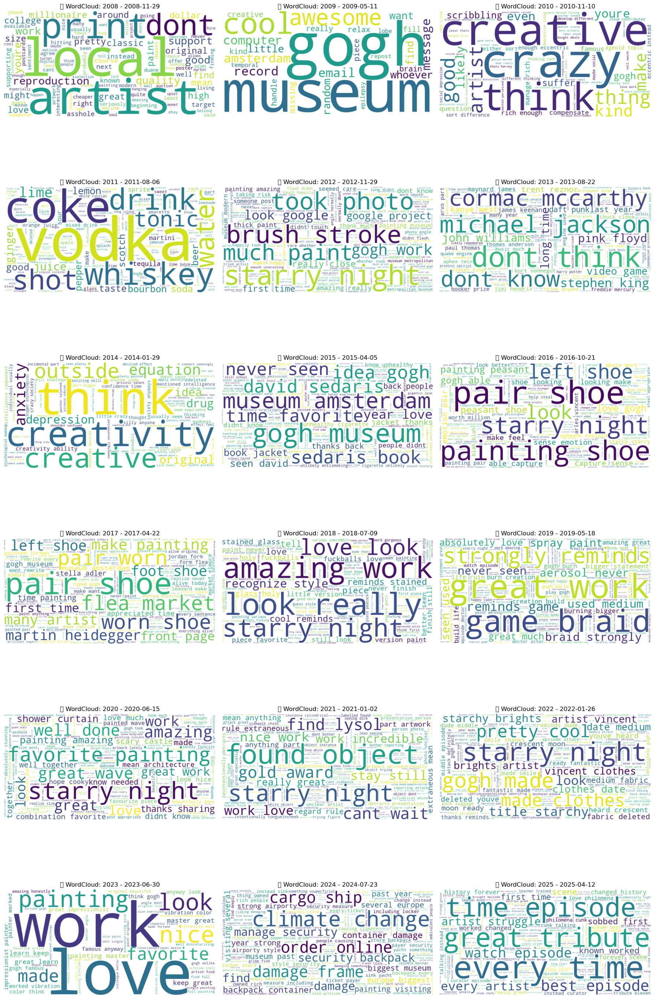

,Year,Peak Date,Total Comments,Mean Sentiment,Top Words
0,2008,2008-11-29,9,0.548,"'artist',, 'local',, 'like',, 'print',, 'repro..."
1,2009,2009-05-11,5,0.396,"['gogh',, 'museum',, 'awesome',, 'amsterdam',,..."
2,2010,2010-11-10,21,0.507,"'creative',, 'think',, 'artist',, 'good',, 'cr..."
3,2011,2011-08-06,463,0.130,"'juice',, 'drink',, 'like',, 'vodka',, 'coke',..."
4,2012,2012-11-29,380,0.306,"'painting',, 'paint',, 'gogh',, 'like',, 'real..."
5,2013,2013-08-22,1407,0.273,"'music',, 'like',, 'think',, 'remembered',, 't..."
6,2014,2014-01-29,30,0.264,"'creativity',, 'creative',, 'think',, 'outside..."
7,2015,2015-04-05,408,0.241,"'gogh',, 'painting',, 'amsterdam',, 'like',, '..."
8,2016,2016-10-21,686,0.178,"'shoe',, 'like',, 'painting',, 'look',, 'gogh'..."
9,2017,2017-04-22,497,0.194,"'shoe',, 'painting',, 'gogh',, 'like',, 'reall..."


In [22]:
# Step 1: Identify top-commented day each year
peak_days = df.groupby(['year', 'date_only']).size().reset_index(name='comment_count')
peak_days = peak_days.loc[peak_days.groupby('year')['comment_count'].idxmax()]

# Step 2: Generate wordclouds and summaries
summary = []
wordclouds = []

for _, row in peak_days.iterrows():
    date = row['date_only']
    year = row['year']
    sub_df = df[df['date_only'] == date]
    
    # Generate word cloud
    text_blob = " ".join(sub_df['final_cleaned'].dropna().astype(str))
    if text_blob.strip():
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_blob)
        wordclouds.append((f"{year} - {date}", wordcloud))
    
    # Get top words from tokens
    top_words = Counter(" ".join(sub_df['filtered_tokens'].astype(str)).split()).most_common(10)
    
    # Prepare summary data
    summary.append({
        'Year': year,
        'Peak Date': date,
        'Total Comments': len(sub_df),
        'Mean Sentiment': round(sub_df['compound'].mean(), 3) if 'compound' in sub_df else 'N/A',
        'Top Words': ', '.join([w for w, _ in top_words])
    })

# Step 3: Plot wordclouds in a grid (3 per row)
cols = 3
rows = -(-len(wordclouds) // cols)  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()

for i, (title, wc) in enumerate(wordclouds):
    axes[i].imshow(wc, interpolation='bilinear')
    axes[i].set_title(f"🌟 WordCloud: {title}", fontsize=12)
    axes[i].axis("off")

# Hide any unused subplot boxes
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

# Step 4: Display the summary table
pd.DataFrame(summary)


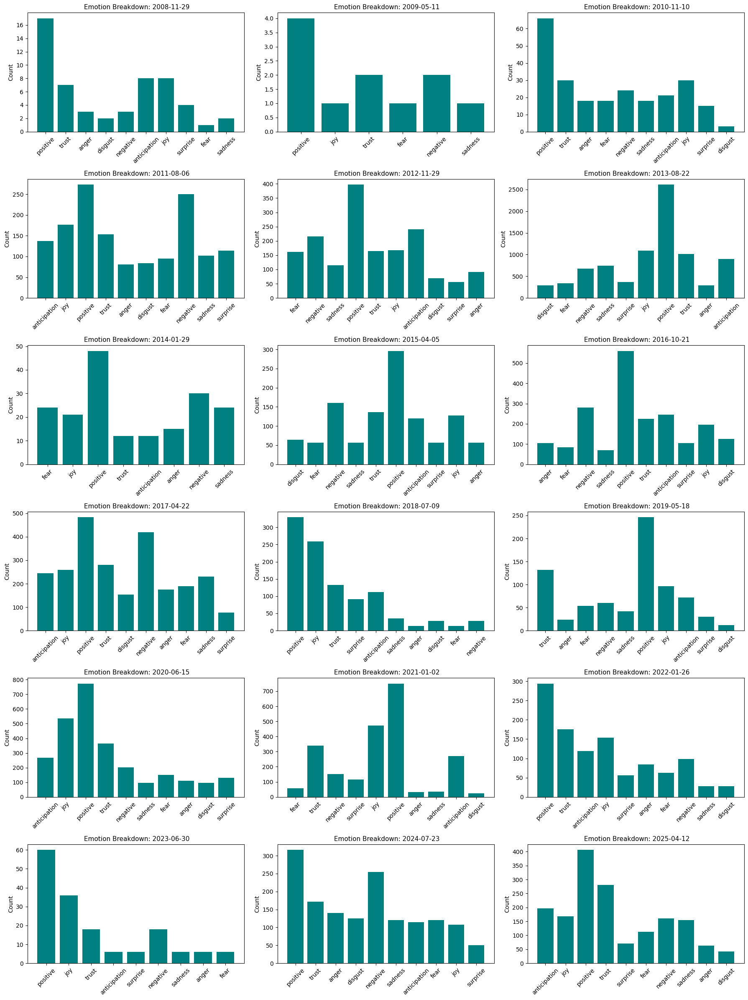

In [23]:
# Collect emotion data for each peak date
emotion_plots = []

for _, row in peak_days.iterrows():
    date = row['date_only']
    day_df = df[df['date_only'] == date]

    # Flatten token list safely
    flat_tokens = []
    for tokens in day_df['filtered_tokens'].dropna():
        if isinstance(tokens, list):
            flat_tokens.extend([token.lower() for token in tokens])
        elif isinstance(tokens, str) and tokens.startswith("[") and tokens.endswith("]"):
            try:
                eval_tokens = eval(tokens)
                if isinstance(eval_tokens, list):
                    flat_tokens.extend([token.lower() for token in eval_tokens])
            except:
                continue

    # Count emotions
    emotion_count = defaultdict(int)
    for token in flat_tokens:
        for emotion in nrc.get(token, []):
            emotion_count[emotion] += 1

    if emotion_count:
        emotion_plots.append((f"{date}", dict(emotion_count)))

# Plot in grid: 3 per row
cols = 3
rows = -(-len(emotion_plots) // cols)  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4))
axes = axes.flatten()

for i, (title, emo_dict) in enumerate(emotion_plots):
    axes[i].bar(emo_dict.keys(), emo_dict.values(), color='teal')
    axes[i].set_title(f" Emotion Breakdown: {title}", fontsize=11)
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [24]:
from nrclex import NRCLex
from tqdm import tqdm
tqdm.pandas()

# Function to extract dominant emotions
def get_nrc_emotions(text):
    if not isinstance(text, str) or len(text) < 3:
        return {}
    doc = NRCLex(text)
    return doc.raw_emotion_scores

# Apply emotion extraction to the final_cleaned column
emotion_scores = df['final_cleaned'].progress_apply(get_nrc_emotions)

# Convert list of dicts into a DataFrame
emotion_df = pd.json_normalize(emotion_scores)

# Join emotion scores to original df
df = pd.concat([df.reset_index(drop=True), emotion_df.fillna(0)], axis=1)

# Show the first few rows to confirm
df[['final_cleaned', 'anger', 'joy', 'sadness', 'fear', 'trust']].head()


100%|██████████| 23372/23372 [00:08<00:00, 2768.41it/s]


,final_cleaned,anger,joy,sadness,fear,trust
0,personally gogh three favorite artist feel loo...,0.0,1.0,1.0,1.0,1.0
1,ever seen work person book seen starry night t...,1.0,8.0,1.0,3.0,10.0
2,define impressive word alone suggests dimensio...,0.0,0.0,0.0,0.0,1.0
3,dont understand ability seems mean little world,0.0,0.0,0.0,0.0,0.0
4,think content time also recognized maybe techn...,1.0,1.0,0.0,0.0,1.0


C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

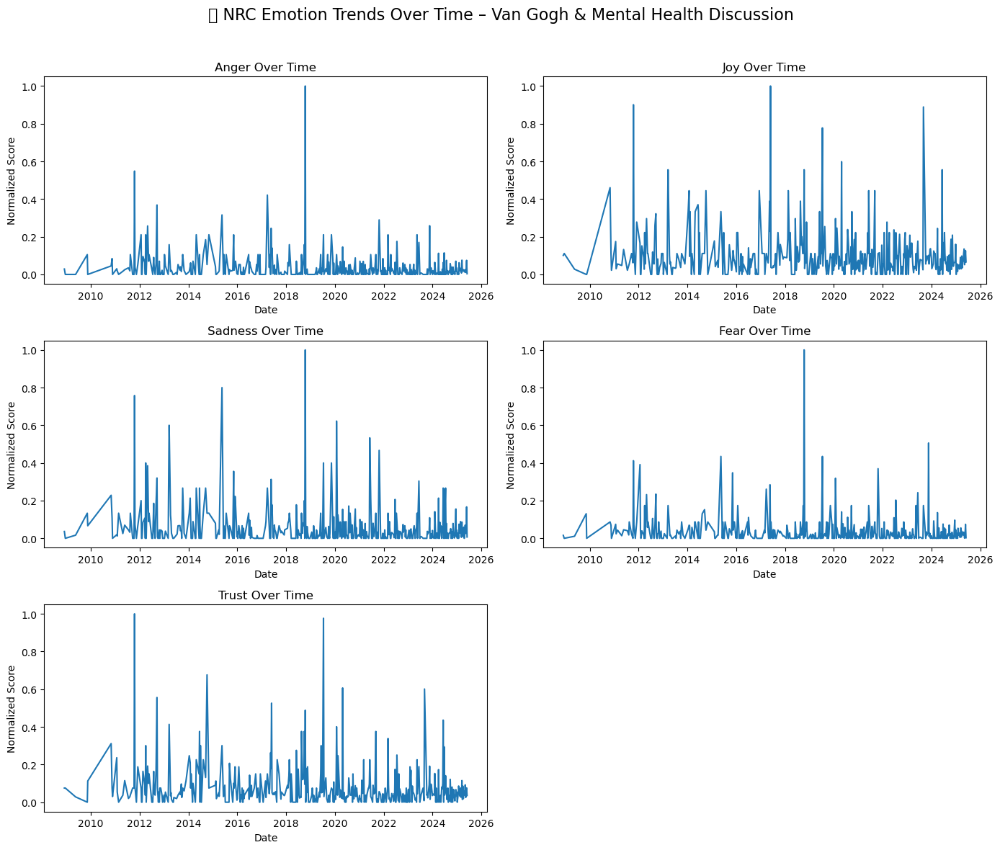

In [29]:
# Step 1: Convert date column and set as index
df['date_only'] = pd.to_datetime(df['date_only'], errors='coerce')
emotion_df = df[['date_only', 'anger', 'joy', 'sadness', 'fear', 'trust']].copy()
emotion_df = emotion_df.dropna(subset=['date_only'])

# Step 2: Resample to weekly average to smooth out noise
emotion_df = emotion_df.set_index('date_only')
weekly_emotions = emotion_df.resample('W').mean()

# Step 3: Normalize values (optional, for visual scaling)
normalized = weekly_emotions.div(weekly_emotions.max())

# Step 4: Plot all emotions on separate subplots
plt.figure(figsize=(14, 12))
emotions = ['anger', 'joy', 'sadness', 'fear', 'trust']

for i, emotion in enumerate(emotions):
    plt.subplot(3, 2, i+1)
    sns.lineplot(data=normalized, x=normalized.index, y=emotion)
    plt.title(f"{emotion.capitalize()} Over Time")
    plt.ylabel("Normalized Score")
    plt.xlabel("Date")

plt.suptitle("NRC Emotion Trends Over Time – Van Gogh & Mental Health Discussion", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

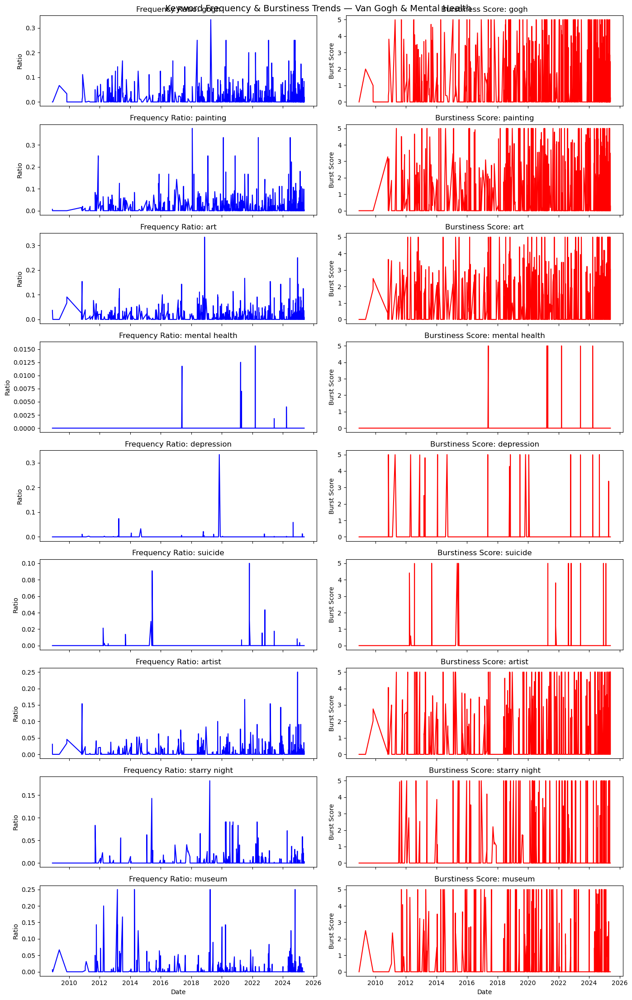

In [30]:
# Convert date column to datetime and prepare tokens
df['date_only'] = pd.to_datetime(df['date_only'])
df['filtered_tokens'] = df['filtered_tokens'].astype(str).apply(eval)

# Updated phrase-based keywords
keywords = ["gogh", "painting", "art", "mental health", "depression", "suicide", "artist", "starry night", "museum"]

# Compute daily keyword frequency and total tokens
daily_keyword_counts = {}
daily_total_tokens = {}

for date, group in df.groupby(df['date_only']):
    tokens = sum(group['filtered_tokens'], [])  # flatten list
    tokens = [t.lower() for t in tokens]
    all_text = " ".join(tokens)

    freq = Counter()
    for phrase in keywords:
        freq[phrase] = all_text.count(phrase)

    daily_keyword_counts[date] = freq
    daily_total_tokens[date] = len(tokens)

# Create DataFrames
daily_df = pd.DataFrame.from_dict(daily_keyword_counts, orient='index').sort_index().fillna(0)
daily_df['total'] = pd.Series(daily_total_tokens)

# Calculate frequency ratio
ratio_df = daily_df[keywords].div(daily_df['total'], axis=0).fillna(0)

# Burstiness score using moving average
burstiness_scores = {}
window = 5  # 5-day window for smoothing

for word in keywords:
    moving_avg = ratio_df[word].rolling(window=window, center=True).mean()
    burstiness = ratio_df[word] / (moving_avg + 1e-6)  # avoid division by zero
    burstiness_scores[word] = burstiness

burst_df = pd.DataFrame(burstiness_scores)

# Plot frequency ratios and burstiness
fig, axes = plt.subplots(len(keywords), 2, figsize=(14, len(keywords)*2.5), sharex=True)

for i, word in enumerate(keywords):
    axes[i, 0].plot(ratio_df.index, ratio_df[word], color='blue')
    axes[i, 0].set_title(f"Frequency Ratio: {word}")
    axes[i, 0].set_ylabel("Ratio")

    axes[i, 1].plot(burst_df.index, burst_df[word], color='red')
    axes[i, 1].set_title(f"Burstiness Score: {word}")
    axes[i, 1].set_ylabel("Burst Score")

for ax in axes[-1]:
    ax.set_xlabel("Date")

fig.suptitle("Keyword Frequency & Burstiness Trends — Van Gogh & Mental Health", fontsize=14)
plt.tight_layout()
plt.show()

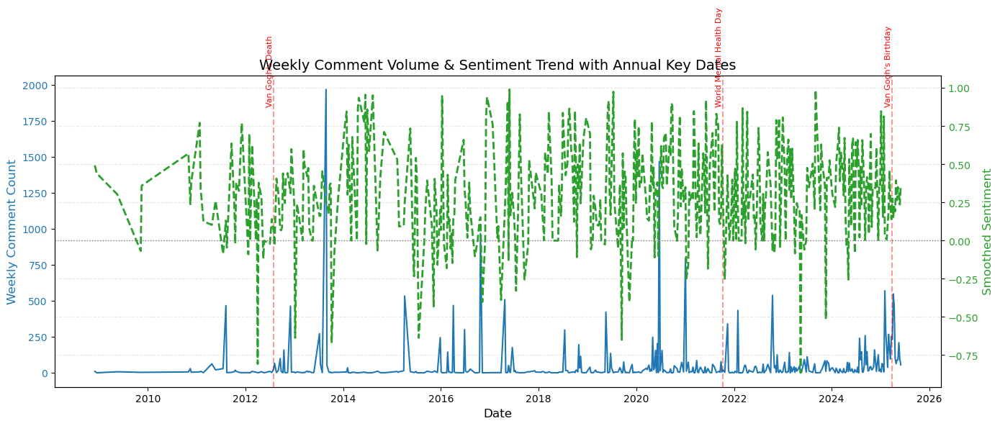

In [74]:
# Range of years in your data
start_year = weekly_df.index.min().year
end_year = weekly_df.index.max().year

# Important recurring dates
event_template = {
    "Van Gogh's Birthday": "-03-30",
    "Van Gogh's Death": "-07-29",
    "World Mental Health Day": "-10-10"
}

# Plot setup
fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot comment count
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylabel("Weekly Comment Count", color='tab:blue', fontsize=12)
ax1.plot(weekly_df.index, weekly_df['count'], color='tab:blue', linewidth=1.5)
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Plot smoothed sentiment
ax2 = ax1.twinx()
ax2.set_ylabel("Smoothed Sentiment", color='tab:green', fontsize=12)
ax2.plot(weekly_df.index, weekly_df['smoothed_sentiment'], color='tab:green', linestyle='--', linewidth=2)
ax2.axhline(0, color='gray', linestyle=':', linewidth=1)
ax2.tick_params(axis='y', labelcolor='tab:green')

# Plot each event for every year in range
for year in range(start_year, end_year + 1):
    for event, suffix in event_template.items():
        date_str = f"{year}{suffix}"
        event_date = pd.to_datetime(date_str)
        if event_date in weekly_df.index:
            ax1.axvline(event_date, color='red', linestyle='--', alpha=0.4)
            ax1.text(event_date, ax1.get_ylim()[1]*0.9, event, rotation=90, fontsize=8, color='red', ha='right')

# Final styling
plt.title("Weekly Comment Volume & Sentiment Trend with Annual Key Dates", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.3)
fig.tight_layout()
plt.show()


C:\Users\HP\AppData\Local\Temp\ipykernel_49060\987908630.py:75: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
C:\Users\HP\AppData\Local\Temp\ipykernel_49060\987908630.py:75: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


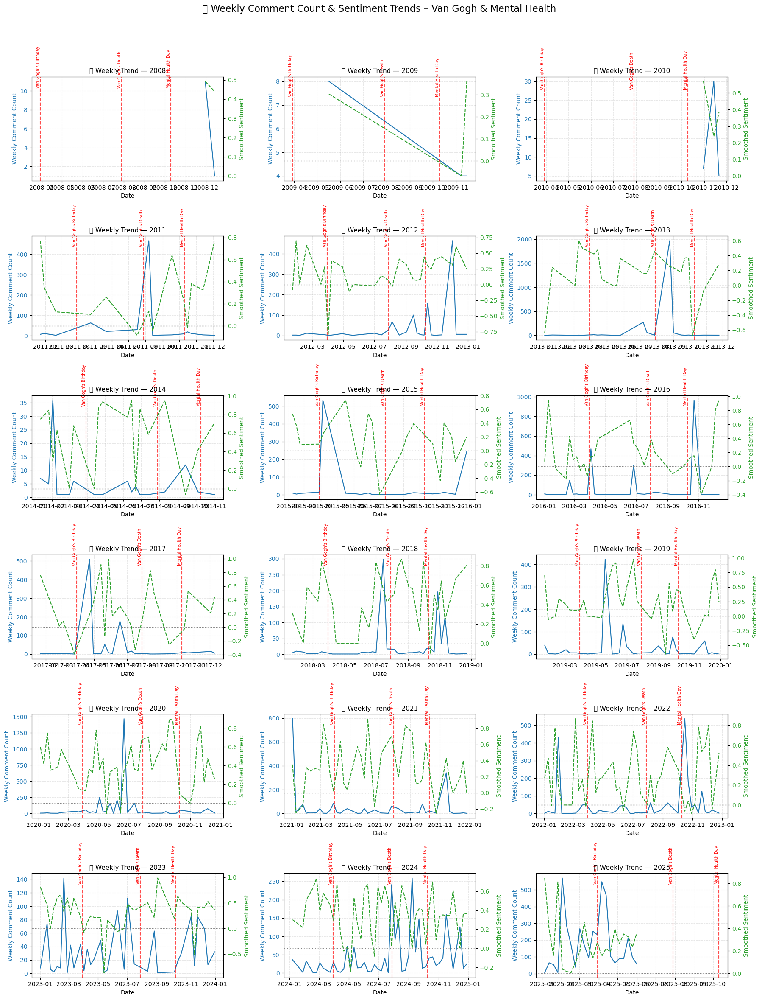

In [33]:
# Ensure 'date_only' column is datetime
df['date_only'] = pd.to_datetime(df['date_only'], errors='coerce')

# Check for 'compound' and 'comment_id' or any column to count comments
# If you don't have 'comment_id', use any unique field like 'text' or just count rows
if 'comment_id' not in df.columns:
    df['comment_id'] = range(len(df))  # Dummy comment ID if missing

# Resample to weekly data: mean sentiment and comment count
weekly_df = df.set_index('date_only').resample('W').agg({
    'compound': 'mean',        # smoothed sentiment
    'comment_id': 'count'      # total comment count
}).rename(columns={'compound': 'smoothed_sentiment', 'comment_id': 'count'})

# Drop missing data (optional)
weekly_df.dropna(inplace=True)

# Add 'year' column for grouping
weekly_df['year'] = weekly_df.index.year

# --- Step 2: Plot each year in 3 columns ---

# Get all unique years in sorted order
unique_years = sorted(weekly_df['year'].unique())

# Set up subplot grid
cols = 3
rows = -(-len(unique_years) // cols)  # Ceiling division
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4), sharex=False)

axes = axes.flatten()  # Flatten for easy indexing

# Loop through each year
for i, year in enumerate(unique_years):
    ax1 = axes[i]
    yearly_data = weekly_df[weekly_df['year'] == year]

    # Plot comment count
    ax1.plot(yearly_data.index, yearly_data['count'], color='tab:blue', label='Comment Count')
    ax1.set_ylabel("Weekly Comment Count", color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    ax1.set_title(f"📅 Weekly Trend — {year}", fontsize=11)
    ax1.set_xlabel("Date")

    # Twin axis for sentiment
    ax2 = ax1.twinx()
    ax2.plot(yearly_data.index, yearly_data['smoothed_sentiment'], color='tab:green', linestyle='--', label='Sentiment')
    ax2.set_ylabel("Smoothed Sentiment", color='tab:green')
    ax2.axhline(0, color='gray', linestyle=':', linewidth=1)
    ax2.tick_params(axis='y', labelcolor='tab:green')

    # Add event lines
    key_events = {
        "Van Gogh's Birthday": f"{year}-03-30",
        "Van Gogh's Death": f"{year}-07-29",
        "Mental Health Day": f"{year}-10-10"
    }

    for label, date_str in key_events.items():
        try:
            event_date = pd.to_datetime(date_str)
            ax1.axvline(event_date, color='red', linestyle='--', alpha=0.7)
            ax1.text(event_date, ax1.get_ylim()[1]*0.9, label, rotation=90, fontsize=7, color='red', ha='right')
        except:
            continue

    ax1.grid(True, linestyle='--', alpha=0.3)

# Hide unused subplot boxes if any
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add overall title
plt.suptitle("Weekly Comment Count & Sentiment Trends – Van Gogh & Mental Health", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Topic Modelling

In [38]:
# Use your preprocessed token list
token_lists = df['filtered_tokens']

# Create Dictionary and Corpus
dictionary = corpora.Dictionary(token_lists)
dictionary.filter_extremes(no_below=5, no_above=0.5)
corpus = [dictionary.doc2bow(text) for text in token_lists]

# Train LDA model 
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=6, random_state=42, passes=10)

# Print topics
for idx, topic in lda_model.print_topics(-1):
    print(f" Topic {idx}:")
    print(topic)
    print("\n")

 Topic 0:
0.021*"like" + 0.018*"belief" + 0.017*"dont" + 0.014*"think" + 0.012*"argument" + 0.012*"make" + 0.011*"night" + 0.010*"know" + 0.010*"going" + 0.010*"right"


 Topic 1:
0.038*"love" + 0.025*"like" + 0.020*"work" + 0.017*"great" + 0.017*"look" + 0.015*"painting" + 0.015*"beautiful" + 0.014*"really" + 0.013*"amazing" + 0.012*"done"


 Topic 2:
0.020*"like" + 0.013*"music" + 0.011*"think" + 0.010*"people" + 0.008*"necessary" + 0.008*"work" + 0.008*"deleted" + 0.007*"remembered" + 0.007*"time" + 0.007*"history"


 Topic 3:
0.019*"good" + 0.017*"artist" + 0.012*"religion" + 0.012*"think" + 0.010*"dont" + 0.010*"life" + 0.009*"painting" + 0.009*"would" + 0.008*"work" + 0.008*"also"


 Topic 4:
0.012*"fucking" + 0.011*"cause" + 0.009*"john" + 0.008*"free" + 0.008*"read" + 0.007*"crazy" + 0.007*"illness" + 0.007*"sheet" + 0.006*"question" + 0.006*"thing"


 Topic 5:
0.021*"painting" + 0.018*"gogh" + 0.016*"time" + 0.010*"museum" + 0.008*"life" + 0.007*"work" + 0.007*"vincent" + 0.00

In [71]:
# Final topic labels (after TF-IDF auto-labeling + your review)
topic_labels = {
    0: "Beliefs, debates, and user opinions ",
    1: "Artistic admiration and emotional engagement ",
    2: "Legacy, memory, and censorship ",  
    3: "Artist & Spiritual Reflection",
    4: "Mental Health",
    5: "Van Gogh Biography, art "
}

# Extract top words for each topic
topic_summaries = []

for idx, topic in lda_model.show_topics(num_topics=-1, num_words=50, formatted=False):
    top_words = ", ".join([word for word, _ in topic])
    topic_summaries.append({
        "Topic Number": idx,
        "Topic Label": topic_labels[idx],
        "Top Words": top_words
    })

# Create a DataFrame
topic_df = pd.DataFrame(topic_summaries)
display(topic_df)

,Topic Number,Topic Label,Top Words
0,0,"Beliefs, debates, and user opinions","like, religion, good, dont, feel, fucking, bel..."
1,1,Artistic admiration and emotional engagement,"life, artist, people, dont, thing, like, think..."
2,2,"Legacy, memory, and censorship","belief, argument, people, premise, time, think..."
3,3,Artist & Spiritual Reflection,"painting, gogh, love, work, like, much, really..."
4,4,Mental Health,"seen, gogh, book, anxiety, never, live, poetry..."
5,5,"Van Gogh Biography, art","necessary, seems, course, thing, would, true, ..."


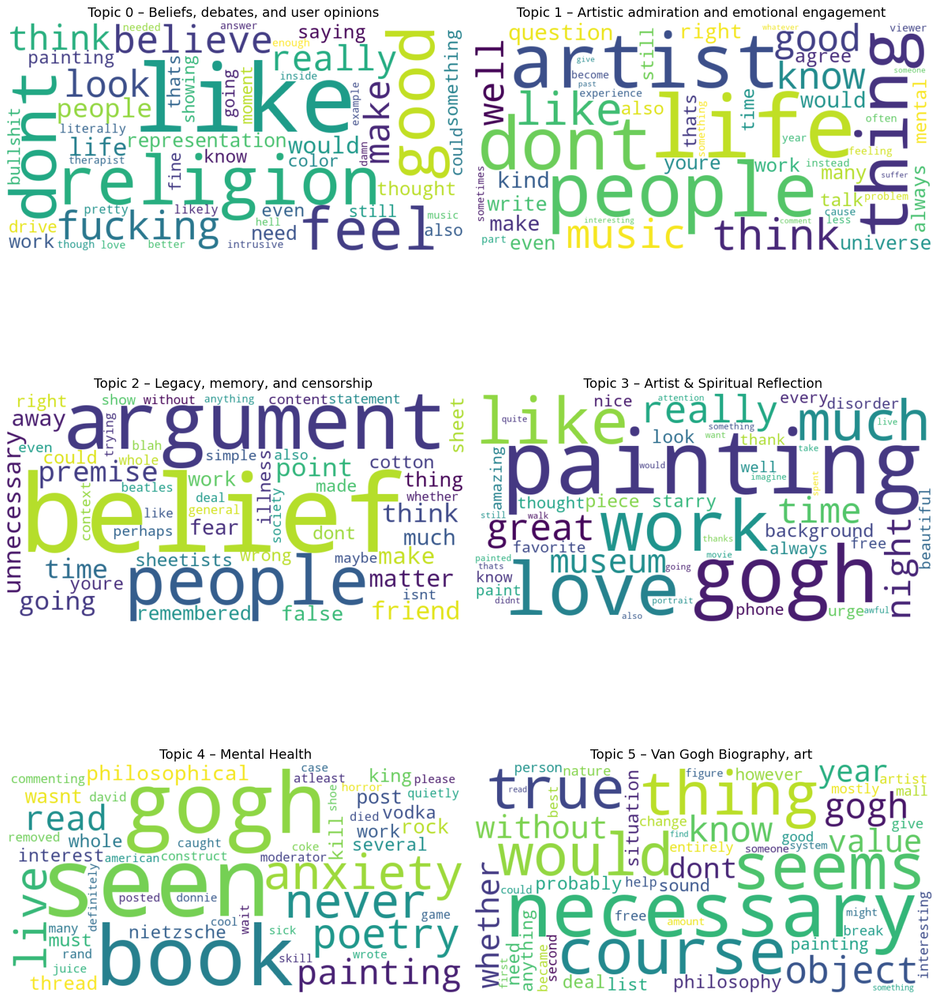

In [72]:
def plot_lda_wordclouds(lda_model, num_topics, topic_labels):
    cols = 2
    rows = (num_topics + 1) // cols
    plt.figure(figsize=(14, 6 * rows))
    
    for i in range(num_topics):
        plt.subplot(rows, cols, i + 1)
        word_freq = dict(lda_model.show_topic(i, topn=50))  # top 50 words
        wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {i} – {topic_labels[i]}", fontsize=14)
    
    plt.tight_layout()
    plt.show()

# Call the function with labels
plot_lda_wordclouds(lda_model, num_topics=6, topic_labels=topic_labels)

In [54]:
df['filtered_tokens'] = df['filtered_tokens'].astype(str).apply(eval)
token_lists = [tokens for tokens in df['filtered_tokens'] if isinstance(tokens, list) and len(tokens) > 1]

#  Dictionary and Corpus Creation 
dictionary = corpora.Dictionary(token_lists)
dictionary.filter_extremes(no_below=5, no_above=0.5)

corpus = [dictionary.doc2bow(text) for text in token_lists]

# --- Step 3: Train LDA Model ---
lda_model = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=6,
    random_state=42,
    passes=10
)

# Step 4: Display Topics (Optional) 
for idx, topic in lda_model.print_topics(-1):
    print(f"Topic {idx}:")
    print(topic)
    print("\n")

# --- Step 5: Visualize with pyLDAvis in Notebook ---
pyLDAvis.enable_notebook()  # Enable inline visualization
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
display(vis_data)

Topic 0:
0.044*"like" + 0.019*"religion" + 0.018*"good" + 0.017*"dont" + 0.015*"feel" + 0.012*"fucking" + 0.011*"believe" + 0.011*"look" + 0.010*"really" + 0.010*"make"


Topic 1:
0.018*"life" + 0.013*"artist" + 0.013*"people" + 0.013*"dont" + 0.011*"thing" + 0.011*"like" + 0.011*"think" + 0.009*"music" + 0.008*"know" + 0.008*"good"


Topic 2:
0.021*"belief" + 0.015*"argument" + 0.013*"people" + 0.012*"premise" + 0.011*"time" + 0.010*"think" + 0.010*"point" + 0.009*"going" + 0.009*"friend" + 0.009*"unnecessary"


Topic 3:
0.026*"painting" + 0.020*"gogh" + 0.018*"love" + 0.016*"work" + 0.014*"like" + 0.013*"much" + 0.013*"really" + 0.012*"great" + 0.012*"time" + 0.011*"night"


Topic 4:
0.014*"seen" + 0.011*"gogh" + 0.010*"book" + 0.010*"anxiety" + 0.010*"never" + 0.008*"live" + 0.007*"poetry" + 0.007*"painting" + 0.007*"read" + 0.007*"philosophical"


Topic 5:
0.014*"necessary" + 0.010*"seems" + 0.010*"course" + 0.009*"thing" + 0.008*"would" + 0.008*"true" + 0.008*"object" + 0.007*"gog

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.038014  0.201204       1        1  22.413896
1     -0.147118 -0.003387       2        1  18.169432
0     -0.078981  0.202902       3        1  17.567898
5     -0.031991 -0.129095       4        1  15.591619
2     -0.142497 -0.202412       5        1  15.073371
4      0.362574 -0.069212       6        1  11.183785, topic_info=           Term         Freq        Total Category  logprob  loglift
152        like  3439.000000  3439.000000  Default  30.0000  30.0000
635      belief   792.000000   792.000000  Default  29.0000  29.0000
3157   religion   830.000000   830.000000  Default  28.0000  28.0000
4168   argument   619.000000   619.000000  Default  27.0000  27.0000
3306  necessary   606.000000   606.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
8          gogh   290.230124  1952.828986   Topic6  -4.5503   0.2843
2244    several   131.232722   273.558590   Topic6  -5.3440   1.4562
59     painting   184.860117  2172.156616   Topic6  -5.0014  -0.2732
628       whole   132.211390   362.272093   Topic6  -5.3366   1.1827
17         work   125.243955  1860.011526   Topic6  -5.3907  -0.5074

[389 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
5292      5  0.990621    abuse
18        4  0.989258  account
4864      4  0.999027   advice
3819      4  0.990902   afraid
3233      2  0.998772    agree
...     ...       ...      ...
931       3  0.992386   yellow
287       1  0.057756    youre
287       2  0.482543    youre
287       4  0.141596    youre
287       5  0.314864    youre

[627 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 1, 6, 3, 5])